In [1]:
!pip install gdown  # Ensure gdown is installed

In [2]:
import gdown

# Replace FILE_ID with your actual file ID
file_id = "1d9qW_ctiCjKOiuA7-O6mX4cJgP3jcTDf"
output_file = "Pothole_Image_Segmentation_Datasets.zip"

# Download the file
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1d9qW_ctiCjKOiuA7-O6mX4cJgP3jcTDf
From (redirected): https://drive.google.com/uc?id=1d9qW_ctiCjKOiuA7-O6mX4cJgP3jcTDf&confirm=t&uuid=91bea0d3-da6a-4afd-845c-ce32a8d7544c
To: /content/Pothole_Image_Segmentation_Datasets.zip
100%|██████████| 66.1M/66.1M [00:01<00:00, 35.9MB/s]


'Pothole_Image_Segmentation_Datasets.zip'

In [3]:
import zipfile
z = zipfile.ZipFile('/content/Pothole_Image_Segmentation_Datasets.zip')
z.extractall()

In [4]:
!pip install segmentation-models-pytorch

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import torch
import torchvision.models.segmentation as models
import os
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader
# import albumentations as A
# from albumentations.pytorch import ToTensorV2
import torch.optim as optim
import torch.nn as nn
from PIL import Image
import random
import matplotlib.pyplot as plt
import torch.optim.lr_scheduler as lr_scheduler
import segmentation_models_pytorch as smp

C:\Users\dell\AppData\Roaming\Python\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
# Directories
images_dir = "Pothole_Image_Segmentation_Datasets/train/images"
images_mask = "Pothole_Image_Segmentation_Datasets/train/labels"

images_dir_files = os.listdir(images_dir)

images_mask_files = os.listdir(images_mask)

mask_files = os.listdir(images_mask)
org_files = os.listdir(images_dir)

for f in mask_files:
  f = f[:-4] + '.jpg'
  if f not in org_files:
    os.remove(os.path.join(images_mask, f))


In [7]:
print(len(os.listdir(images_dir)))
print(len(os.listdir(images_mask)))

720
720


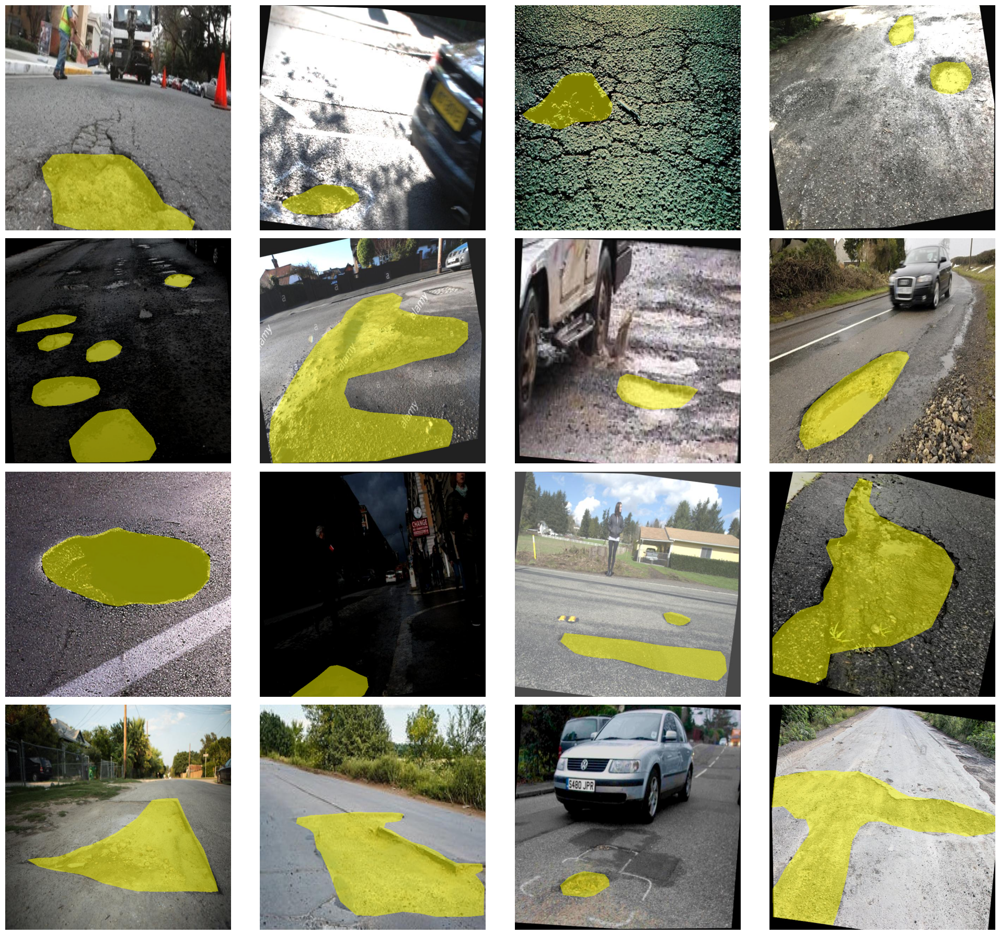

In [3]:
# Directories
images_dir = "Pothole_Image_Segmentation_Datasets/train/images"
annotations_dir = "Pothole_Image_Segmentation_Datasets/train/labels"

images = os.listdir(images_dir)

# Create a grid for visualization
fig, ax = plt.subplots(4, 4, figsize=(20, 18))
ax = ax.ravel()

# Define transparency level (0 to 1)
alpha = 0.5  # 50% transparency

# Define class names and their corresponding colors
class_names = ["Pothole"]
class_colors = {
    0: (255, 255, 0),  # Yellow for class 0 (Pothole)
}


def draw_polygons(image, annotation_file):
    """Draw polygons on the image from annotation file."""
    overlay = image.copy()  # ✅ Copy original image to overlay
    mask = np.zeros(image.shape[:2], dtype=np.uint8)  # Mask to keep track of regions

    with open(annotation_file, "r") as f:
        for line in f:
            data = line.strip().split()
            class_id = int(data[0])  # First value is the class ID
            points = np.array(data[1:], dtype=np.float32).reshape(-1, 2)

            # Convert normalized coordinates to absolute pixel values
            h, w, _ = image.shape
            points[:, 0] *= w
            points[:, 1] *= h
            points = points.astype(np.int32)

            # Draw polygon on overlay
            cv2.fillPoly(overlay, [points], class_colors[class_id])

            # Update the mask to mark the polygon area
            cv2.fillPoly(mask, [points], 255)

    # Blend only the polygon area using the mask
    blended_image = image.copy()
    blended_image[mask == 255] = cv2.addWeighted(image, 1 - alpha, overlay, alpha, 0)[mask == 255]

    return blended_image


# ---------------------------
# Process and display images
# ---------------------------
for i in range(16):
    # Randomly select an image
    img = random.choice(images)
    img_path = os.path.join(images_dir, img)
    annotation_path = os.path.join(annotations_dir, img[:-4] + ".txt")

    # Load image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw polygons if annotation exists
    if os.path.exists(annotation_path):
        image = draw_polygons(image, annotation_path)

    # Display the segmented image
    ax[i].imshow(image)
    ax[i].axis("off")  # Hide axis for better visualization
            # Save only the individual subplot
    extent = ax[i].get_tightbbox(fig.canvas.get_renderer()).transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f"img/subplot_001vdd{i}.png", bbox_inches=extent, dpi=300)

plt.tight_layout()
plt.show()


In [9]:
# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load Pretrained U-Net with ResNet34 backbone
model = smp.Unet(
    encoder_name="resnet34",         # Use ResNet34 as encoder
    encoder_weights="imagenet",      # Pretrained on ImageNet
    in_channels=3,                   # RGB input
    classes=2,                       # 2 output channels (BG & Person)
)

# Move model to GPU if available
model = model.to(device)

print("Model is ready for binary segmentation (BG & Person) using U-Net with ResNet34.")


Using device: cuda


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 231MB/s]


Model is ready for binary segmentation (BG & Person) using U-Net with ResNet34.


In [10]:
class PotholeSegmentationDataset(Dataset):
    def __init__(self, images_dir, annotations_dir, image_size=(224, 224), transform=None):
        self.images_dir = images_dir
        self.annotations_dir = annotations_dir
        self.image_filenames = sorted(os.listdir(images_dir))
        self.annotation_filenames = sorted(os.listdir(annotations_dir))
        self.image_size = image_size
        self.transform = transform

        # Define class labels (Background and Pothole)
        self.class_labels = {
            0: "BG",
            1: "Pothole"
        }

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_filenames[idx])
        annotation_path = os.path.join(self.annotations_dir, self.annotation_filenames[idx])

        # Load image and convert to RGB
        # ---------------------------
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # ---------------------------
        # Create an empty mask
        # ---------------------------
        mask = np.zeros((h, w), dtype=np.uint8)

        # ---------------------------
        # Load and parse annotation file
        # ---------------------------
        if os.path.exists(annotation_path):
            with open(annotation_path, "r") as f:
                for line in f:
                    data = line.strip().split()
                    class_id = int(data[0])  # First value is the class ID
                    points = np.array(data[1:], dtype=np.float32).reshape(-1, 2)

                    # Convert normalized coordinates to pixel values
                    points[:, 0] *= w
                    points[:, 1] *= h
                    points = points.astype(np.int32)

                    # Fill polygon on the mask
                    cv2.fillPoly(mask, [points], 1)

        # ---------------------------
        # Resize image and mask to target size
        # ---------------------------
        image = cv2.resize(image, self.image_size)
        mask = cv2.resize(mask, self.image_size, interpolation=cv2.INTER_NEAREST)

        # ---------------------------
        # Apply transformations if provided
        # ---------------------------
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        return image, torch.tensor(mask, dtype=torch.long)


In [11]:
transform = A.Compose([
    A.Resize(224,224),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# Directories
train_images_dir = "Pothole_Image_Segmentation_Datasets/train/images"
train_images_mask = "Pothole_Image_Segmentation_Datasets/train/labels"

val_images_dir = "Pothole_Image_Segmentation_Datasets/valid/images"
val_images_mask = "Pothole_Image_Segmentation_Datasets/valid/labels"

# Load dataset
train_dataset = PotholeSegmentationDataset(train_images_dir, train_images_mask, transform=transform)
val_dataset = PotholeSegmentationDataset(val_images_dir, val_images_mask, transform=transform)

# DataLoader for training and validation
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# Define Loss and Optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


In [12]:
print(len(train_loader))
print(len(val_loader))
print(len(val_dataset))
print(len(train_dataset))

90
8
60
720


<ipython-input-10-80a4b8c2850e>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return image, torch.tensor(mask, dtype=torch.long)


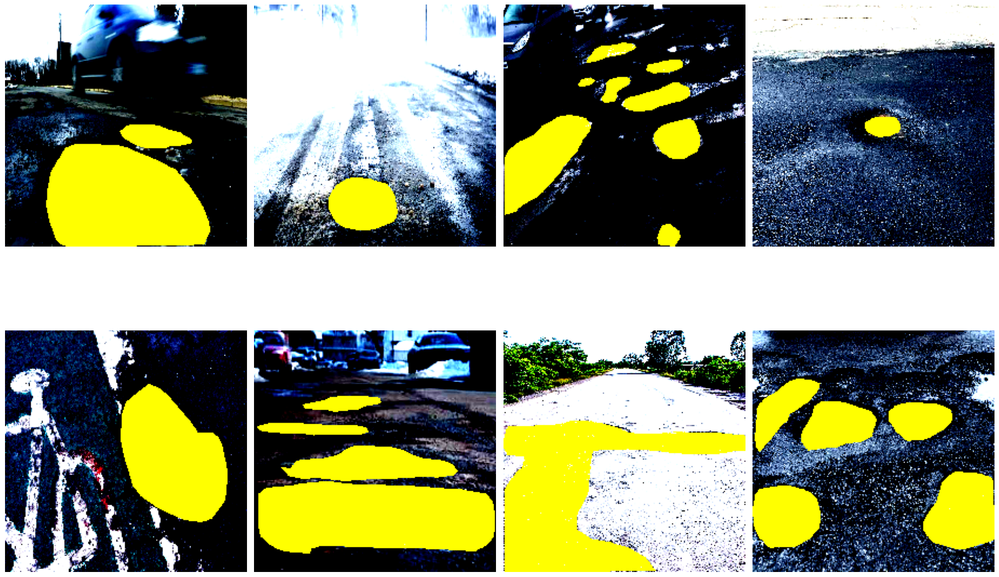

In [13]:
# Define transparency level (0 to 1)
alpha = 0.5 # 50% transparency

# Define class names and their corresponding colors
class_names = ["BG", "Pothole"]
class_colors = {
    1: [255, 255, 0],  # Yellow for Person
}

# Get a random batch from the DataLoader
random_batch_index = random.randint(0, len(val_loader) - 1)

# Iterate through the DataLoader to get the random batch
for batch_idx, (images, masks) in enumerate(val_loader):
    if batch_idx == random_batch_index:
        fig, ax = plt.subplots(2, 4, figsize=(20, 15))
        ax = ax.ravel()

        for i in range(8):
            image = images[i].permute(1, 2, 0).cpu().numpy()
            mask = masks[i].cpu().numpy()

            overlay = np.zeros_like(image)

            for class_id, color in class_colors.items():  # Loop through class 1
                class_mask = (mask == class_id)           # 2D boolean mask where mask == 1
                for c in range(3):
                    overlay[..., c][class_mask] = color[c]

            # Create a copy to preserve original image
            blended_image = image.copy()

            # Where mask == 1, blend
            for c in range(3):  # For each color channel
                blended_image[..., c][mask == 1] = (
                    image[..., c][mask == 1] * (1 - alpha) +
                    overlay[..., c][mask == 1] * alpha
                ).astype(np.uint8)
            ax[i].imshow(blended_image)
            ax[i].axis("off")

        plt.tight_layout()
        plt.show()
        break



In [14]:
# Initialize best loss as a large number
best_loss = float("inf")
save_path = "best_model.pth"  # Path to save the best model

EPOCHS = 30

scheduler = lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=3, T_mult=1, eta_min=1e-6)

for epoch in range(EPOCHS):

    # Training Phase
    model.train()
    epoch_train_loss = 0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()

        # Forward pass for U-Net
        outputs = model(images)

        # Compute loss
        loss = criterion(outputs, masks)

        # Backpropagation
        loss.backward()
        optimizer.step()

        epoch_train_loss += loss.item()

    avg_train_loss = epoch_train_loss / len(train_loader)
    print(f"\n🚀 Epoch [{epoch+1}/{EPOCHS}], Train Loss: {avg_train_loss:.4f}")


    # Validation Phase
    model.eval()
    epoch_val_loss = 0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)

            # Forward pass for U-Net
            outputs = model(images)

            # Compute loss
            val_loss = criterion(outputs, masks)
            epoch_val_loss += val_loss.item()

    avg_val_loss = epoch_val_loss / len(val_loader)
    print(f"🧪 Epoch [{epoch+1}/{EPOCHS}], Val Loss: {avg_val_loss:.4f}")

    # Step the scheduler
    scheduler.step()

    # Save the best model
    if avg_val_loss < best_loss:
        best_loss = avg_val_loss
        torch.save(model.state_dict(), save_path)
        print(f"✅ Model saved with val loss {best_loss:.4f}")

print(f"🎉 Training complete! Best model saved at: {save_path}")


<ipython-input-10-80a4b8c2850e>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return image, torch.tensor(mask, dtype=torch.long)



🚀 Epoch [1/30], Train Loss: 0.4034
🧪 Epoch [1/30], Val Loss: 0.2765
✅ Model saved with val loss 0.2765

🚀 Epoch [2/30], Train Loss: 0.2152
🧪 Epoch [2/30], Val Loss: 0.2226
✅ Model saved with val loss 0.2226

🚀 Epoch [3/30], Train Loss: 0.1627
🧪 Epoch [3/30], Val Loss: 0.2078
✅ Model saved with val loss 0.2078

🚀 Epoch [4/30], Train Loss: 0.1450
🧪 Epoch [4/30], Val Loss: 0.1995
✅ Model saved with val loss 0.1995

🚀 Epoch [5/30], Train Loss: 0.1186
🧪 Epoch [5/30], Val Loss: 0.1885
✅ Model saved with val loss 0.1885

🚀 Epoch [6/30], Train Loss: 0.0925
🧪 Epoch [6/30], Val Loss: 0.1779
✅ Model saved with val loss 0.1779

🚀 Epoch [7/30], Train Loss: 0.0869
🧪 Epoch [7/30], Val Loss: 0.1742
✅ Model saved with val loss 0.1742

🚀 Epoch [8/30], Train Loss: 0.0790
🧪 Epoch [8/30], Val Loss: 0.1709
✅ Model saved with val loss 0.1709

🚀 Epoch [9/30], Train Loss: 0.0644
🧪 Epoch [9/30], Val Loss: 0.1653
✅ Model saved with val loss 0.1653

🚀 Epoch [10/30], Train Loss: 0.0624
🧪 Epoch [10/30], Val Loss: 

Using device: cuda
Processing: Pothole_Image_Segmentation_Datasets/test/road-surface-in-need-of-repair.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/water-puddle-with-mud-and-pebbles-or-rocks.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/pot-hole-on-city-street-a-hazard-to-motorists (2).jpg
Processing: Pothole_Image_Segmentation_Datasets/test/broken-asphalt-pit-on-the-road-in-the-winter-surrounded-by-i.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/close-up-of-a-pot-hole-on-a-gravel-road.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/old-road-potholes-and-holes-outside-city-cloudy-autumn-weath.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/dangerous-destroyed-roadbed-the-bad-asphalted-road-big-potho.jpg
Processing: Pothole_Image_Segmentation_Datasets/test/pothole-damage-on-road-after-winter.jpg


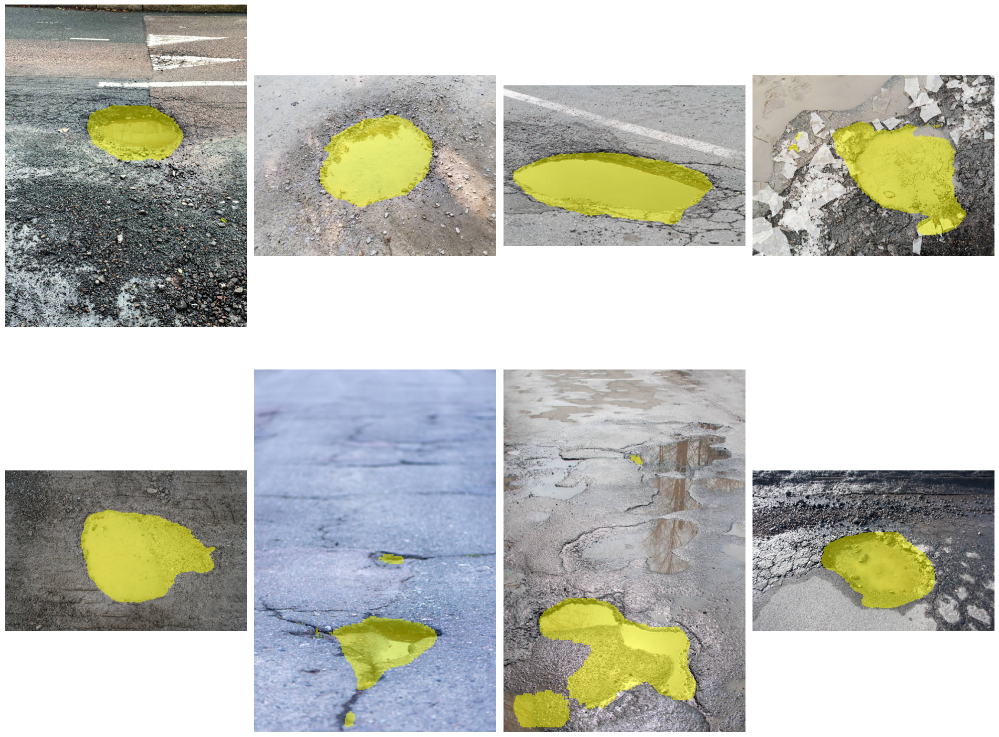

In [17]:
import cv2
import random
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as T
import segmentation_models_pytorch as smp
from PIL import Image

# Load the trained model
model_path = "best_model.pth"

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load Pretrained U-Net with ResNet34 backbone
model = smp.Unet(
    encoder_name="resnet34",         # Use ResNet34 as encoder
    encoder_weights=None,            # No need for pre-trained weights when loading trained model
    in_channels=3,                   # RGB input
    classes=2,                       # 2 output channels (BG & Trash)
)

# Load trained model weights
model.load_state_dict(torch.load(model_path, map_location=device))

# Move model to GPU if available
model = model.to(device)
model.eval()

# Directories
images_dir = "Pothole_Image_Segmentation_Datasets/test"
images = os.listdir(images_dir)

# Create a grid for visualization
fig, ax = plt.subplots(2, 4, figsize=(20, 18))
ax = ax.ravel()

# Define transparency level (0 to 1)
alpha = 0.5  # 50% transparency

# Class definitions (Only Background & Trash)
class_names = ["BG", "Pothole"]
class_colors = {
    1: [255, 255, 0]   # Trash (Yellow)
}

# ✅ Fixed: Correct preprocessing order
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),  # Convert PIL to Tensor FIRST ✅
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize AFTER ToTensor ✅
])

for i in range(8):
    # Randomly select an image
    img = random.choice(images)
    img_path = os.path.join(images_dir, img)
    print(f"Processing: {img_path}")

    # Load image and convert to RGB
    image = Image.open(img_path).convert("RGB")  # ✅ Ensure RGB format

    # Apply model transformations
    input_tensor = transform(image).unsqueeze(0).to(device)  # ✅ Now correctly formatted

    # Model Prediction
    with torch.no_grad():
        output = model(input_tensor)  # Get model output
        predicted_mask = torch.argmax(output.squeeze(0), dim=0).cpu().numpy()  # Shape: (H, W)


    # ✅ Get original image dimensions correctly
    original_width, original_height = image.size

    # ✅ Fixed: Convert PIL image to NumPy before resizing
    image = np.array(image)  # Convert PIL to NumPy

    # Resize predicted mask to match original image size
    mask = cv2.resize(predicted_mask, (original_width, original_height), interpolation=cv2.INTER_NEAREST)

    # Create a colored overlay of the same shape as the image
    overlay = np.zeros_like(image, dtype=np.uint8)

    for class_id, color in class_colors.items():  # Loop through class 1
        class_mask = (mask == class_id)           # 2D boolean mask where mask == 1
        for c in range(3):
            overlay[..., c][class_mask] = color[c]

    # Create a copy to preserve original image
    blended_image = image.copy()

    # Where mask == 1, blend
    for c in range(3):  # For each color channel
        blended_image[..., c][mask == 1] = (
            image[..., c][mask == 1] * (1 - alpha) +
            overlay[..., c][mask == 1] * alpha
        ).astype(np.uint8)

    # Display the segmented image
    ax[i].imshow(blended_image)
    ax[i].axis("off")  # Hide axis for better visualization

# Plot and show final grid
plt.tight_layout()
plt.show()
